In [116]:
#Imports required for clustering
import pandas as pd
from sklearn.preprocessing import LabelEncoder,MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split 
from sklearn.decomposition import PCA
import numpy as np
import warnings
import matplotlib.pyplot as plt
%matplotlib inline
warnings.filterwarnings("ignore")

In [117]:
# Loading Data from the CSV file
data = pd.DataFrame(
    pd.read_csv(
        "../Datasets/FinalMergedDataset/cleaned_numeric_dataset.csv"
    )
)

data.head()

,Unnamed: 0,Source,Destination,Flight Name,type,Status,Time,Actual_Time,Delay
0,0,77,66,4,0,0,1.580602e+09,1.580604e+09,43.0
1,1,40,66,68,0,0,1.580602e+09,1.580603e+09,18.0
2,2,68,27,65,1,1,1.580602e+09,1.580603e+09,25.0
3,3,68,27,26,1,1,1.580602e+09,1.580605e+09,50.0
4,4,68,10,34,1,1,1.580602e+09,1.580605e+09,45.0


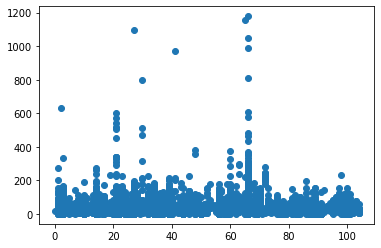

In [134]:
#Plotting Data before clustering
x = np.array(data[["Destination","Delay"]])
plt.scatter(x[:,0],x[:,1], label = "True Position")

In [128]:
# Initializing the Kmeans cluster to form 3 clusters for 1000 iterations
kmeans = KMeans(n_clusters = 3, max_iter=1000)
kmeans.fit(x)
data["cluster"] = kmeans.fit_predict(x) # stores cluster number in an attribute
data.head()

,Unnamed: 0,Source,Destination,Flight Name,type,Status,Time,Actual_Time,Delay,cluster
0,0,77,66,4,0,0,1.580602e+09,1.580604e+09,43.0,1
1,1,40,66,68,0,0,1.580602e+09,1.580603e+09,18.0,1
2,2,68,27,65,1,1,1.580602e+09,1.580603e+09,25.0,0
3,3,68,27,26,1,1,1.580602e+09,1.580605e+09,50.0,0
4,4,68,10,34,1,1,1.580602e+09,1.580605e+09,45.0,0


In [130]:
plotted_data = data[["Destination","Delay","cluster"]]
plotted_data.head()

,Destination,Delay,cluster
0,66,43.0,1
1,66,18.0,1
2,27,25.0,0
3,27,50.0,0
4,10,45.0,0


In [135]:
#Plotting clusters of data 
import plotly.graph_objects as go

fig = go.Figure(
    data = [
        go.Scatter(x = plotted_data[plotted_data["cluster"] == 0]["Destination"],
        y = plotted_data[plotted_data["cluster"] == 0]["Delay"],
        name = "Cluster 1",
        mode = "markers"),
        go.Scatter(x = plotted_data[plotted_data["cluster"] == 1]["Destination"],
        y = plotted_data[plotted_data["cluster"] == 1]["Delay"],
        name = "Cluster 2",
        mode = "markers"),
        go.Scatter(x = plotted_data[plotted_data["cluster"] == 2]["Destination"],
        y = plotted_data[plotted_data["cluster"] == 2]["Delay"],
        name = "Cluster 3",
        mode = "markers"),
    ]
)

# fig = go.Figure(
#     data = [
#         go.scatter(x = plotted_data["Destination"],y=plotted_data["Delay"],mode="markers")
#     ]
# )
fig.show()

In [136]:
#Printing centroid values of the clusters
print(kmeans.cluster_centers_)

[[ 26.25282353  38.16176471]
 [ 67.38902842  20.03820225]
 [ 49.84705882 212.76764706]]


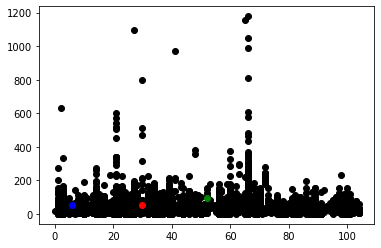

In [137]:
#Implementation using own function
k=3
centroids = {
    i+1 : [np.random.randint(0,100) , np.random.randint(0,100)]
    for i in range(k)
}

import matplotlib.pyplot as plt 

x = data["Destination"]
y= data["Delay"]
colmap = {
    1 : 'r',
    2 : 'g',
    3 : 'b'
}

plt.scatter(x,y,color = "k")
for i in centroids.keys():
    plt.scatter(*centroids[i] , color = colmap[i])
plt.show()

In [140]:
def assignment(data,centroids):
    for i in centroids.keys():
        data["distance_from_{}".format(i)] = (
            np.sqrt(
                (x - centroids[i][0]) **2
                +
                (y - centroids[i][1]) **2
            )
        )
        
        centroid_distance_cols = ["distance_from_{}".format(i) for i in centroids.keys()]

        data["closest"] = data.loc[: , centroid_distance_cols].idxmin(axis = 1)
        data["closest"] = data["closest"].map(
            lambda x: int(x.lstrip("distance_from_"))
        )
        data["color"] = data["closest"].map(lambda x: colmap[x])
    return data        
def update(k):
    for i in centroids.keys():
        centroids[i][0] = np.mean(data[data["closest"] == i]["Destination"])
        centroids[i][1] = np.mean(data[data["closest"] == i]["Delay"])
    return k

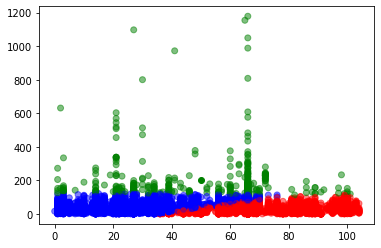

In [142]:
data = assignment(data,centroids)
while True:
    closest_centroids = data["closest"].copy(deep=True)
    centroids = update(centroids)
    data = assignment(data,centroids)
    if closest_centroids.equals(data["closest"]):
        break

plt.scatter(data["Destination"],data["Delay"],color = data["color"],alpha=0.5)

for i in centroids.keys():
    plt.scatter(*centroids[i] , color=colmap[i])
plt.show()

In [ ]:
print(centroids)